# Assignment 2 - Question 2
The objective of this assignment is to get you familiarize with  the  problem  of  `Dimensionality Reduction`.


## Instructions

- Write your code and analysis in the indicated cells.
- Ensure that this notebook runs without errors when the cells are run in sequence.
- Do not attempt to change the contents of other cells.
- No inbuilt functions to be used until specified. Libraries allowed (Numpy, matplotlib)

## Datasets 
- The IIIT-CFW is database for the cartoon faces in the wild. The dataset contains 8928 annotated cartoon faces of famous personalities of the world with varying profession. Additional 1000 real faces of the public figure to study cross modal retrieval tasks, such as, Photo2Cartoon retrieval. Ref - https://cvit.iiit.ac.in/research/projects/cvit-projects/cartoonfaces
- We have sub sampled the following data for this assignment - Cartoon faces of 8 subjects and approx. 100 images for each subject. 

## Submission
- Ensure that this notebook runs without errors when the cells are run in sequence.
- Rename the notebook to `<roll_number>_Q2.ipynb`.
- Fill the Name and Roll number in the below markdown

Name: Mulukutla Krishna Praneet<br>
Roll Number: 2020113010

In [109]:
# Installing Pillow Libraries
!pip install scikit-learn matplotlib Pillow

In [110]:
import numpy as np
import os
from random import randrange
from matplotlib import pyplot as plt
from PIL import Image

## Load Data

In [111]:
cfw_dict = {
    'Amitabhbachan': 0,
    'AamirKhan': 1,
    'DwayneJohnson': 2,
    'AishwaryaRai': 3,
    'BarackObama': 4,
    'NarendraModi': 5,
    'ManmohanSingh': 6,
    'VladimirPutin': 7
}

opt = {
    'image_size': 32,
    'is_grayscale': False,
    'val_split': 0.75
}

In [112]:
def load_image(path):
    im = Image.open(path).convert('L' if opt['is_grayscale'] else 'RGB')
    im = im.resize((opt['image_size'],opt['image_size']))
    im = np.array(im)
    im = im/256
    return im

def display_images(imgs,classes,row=1,col=2,w=32,h=32):
    fig=plt.figure(figsize=(8, 8))
    for i in range(1, col*row +1):
        img = imgs[i-1]
        fig.add_subplot(row, col, i)
        
        if opt['is_grayscale']:
            plt.imshow(img , cmap='gray') 
        else:
            plt.imshow(img)
        
        plt.title("Class:{}".format(classes[i-1]))
        plt.axis('off')
    plt.show()

def load_data(dir_path):
    image_list = []
    y_list = []
    label_dict = cfw_dict
    for filename in sorted(os.listdir(dir_path)):
        if filename.endswith(".png"):
            im = load_image(os.path.join(dir_path,filename))
            y = filename.split('_')[0]
            y = label_dict[y] 
            image_list.append(im)
            y_list.append(y)
        else:
            continue
    image_list = np.array(image_list)
    y_list = np.array(y_list)
    print("Dataset shape:",image_list.shape)
    print("Label shape:",y_list.shape)

    return image_list,y_list

In [113]:
dirpath = './IIIT-CFW/'
X,y = load_data(dirpath)

Dataset shape: (672, 32, 32, 3)
Label shape: (672,)


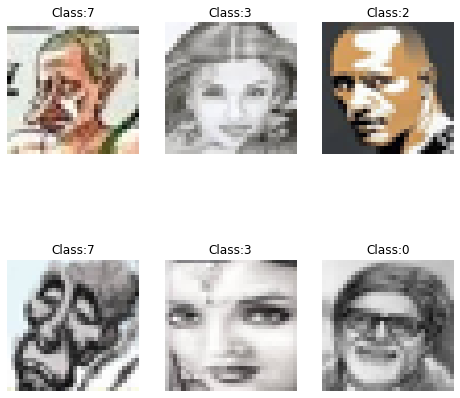

In [114]:
N,H,W = X.shape[0:3]
C = 1 if opt['is_grayscale'] else X.shape[3]

ind = np.random.randint(0,y.shape[0],6)
display_images(X[ind,...],y[ind], row=2,col=3)

## Dimensionality Reduction
- Plot eigen spectrum for the data.

Percentage of variance preserved is defined as the fraction of eigen values used. As we include more principal components to describe the data, the percentage of variances preserved under the dimensionality reduction increases. 

- Plot the percentage of variances vs the number of principal components to validate the above statement.
- Try visualizing these eigen vectors. Comment on what these ghost faces represent 
- Try reconstructing images with your choice of number of principal components and visualize the reconstructed image.

Let's define reconstruction error as the frobenius norm of the difference between original and reconstructed image. 

- Plot the number of principal components vs the corresponding reconstruction error for 5 selected number of principal components of your choice.
- Using the two dominant principal values, plot the data with colors showing the labels. What do you observe?


#### Write a function that gives eigen values and eigen vectors given data

In [115]:
# flatten the image
def flatten(X):
    N = X.shape[0]
    X_flat = X.reshape(N,-1)
    return X_flat

# write function to calculate eigen values and eigen vectors
def eigen(X):
    # flatten the image
    A = flatten(X)
    print("Shape of A:",A.shape)
    # calculate covariance matrix
    mean_face = np.mean(A,axis=0)
    A = A - mean_face
    # cov = np.cov(A.T)
    cov = np.dot(A, A.T) / (A.shape[0] - 1)
    print("Shape of Covariance Matrix:",cov.shape)
    # calculate eigen values and eigen vectors
    eigen_values, eigen_vectors = np.linalg.eigh(cov)
    # flip the eigen vectors and eigen values in descending order
    idx = eigen_values.argsort()[::-1]
    eigen_values = eigen_values[idx]
    eigen_vectors = eigen_vectors[:,idx]
    return eigen_values, eigen_vectors, A, mean_face

# X.shape


#### Compute eigen values and plot eigen value spectrum

Shape of A: (672, 3072)
Shape of Covariance Matrix: (672, 672)
Shape of eigen values: (672,)
Shape of eigen vectors: (672, 672)
Eigen Values: [ 8.05321772e+01  1.99819287e+01  1.29505097e+01  7.10403262e+00
  6.46406331e+00  5.79378157e+00  4.39351523e+00  4.29762441e+00
  3.90835565e+00  3.06725550e+00  2.59805032e+00  2.45102161e+00
  2.23299791e+00  2.09318300e+00  1.99404458e+00  1.87642462e+00
  1.84819775e+00  1.75147583e+00  1.54625082e+00  1.47619947e+00
  1.37650633e+00  1.36504759e+00  1.28388116e+00  1.24783161e+00
  1.19983377e+00  1.13267936e+00  1.08357374e+00  1.04006430e+00
  1.00904868e+00  9.71794348e-01  9.31226164e-01  9.04887862e-01
  8.58280296e-01  8.34932900e-01  8.29355861e-01  7.85902405e-01
  7.74165695e-01  7.53650176e-01  7.34203357e-01  7.02540261e-01
  6.91108133e-01  6.64403723e-01  6.46251902e-01  6.36459809e-01
  6.11035315e-01  5.96788819e-01  5.81709009e-01  5.68572122e-01
  5.57095637e-01  5.37796294e-01  5.30022503e-01  5.10497772e-01
  5.05516700e

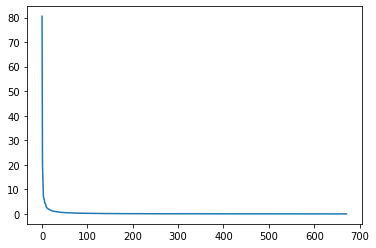

In [116]:
# eigen values and spectrum
eigen_values, eigen_vectors, A, mean_face = eigen(X)
print("Shape of eigen values:",eigen_values.shape)
print("Shape of eigen vectors:",eigen_vectors.shape)

print("Eigen Values:",eigen_values)

# plot the spectrum
plt.plot(eigen_values)

#### Plot the percentage of variances vs the number of principal components

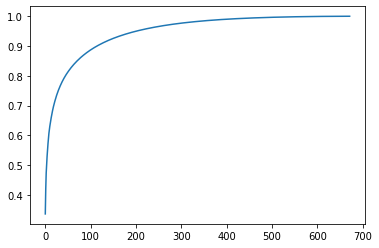

In [117]:
# plot variance vs components

# calculate variance
variance = np.cumsum(eigen_values)/np.sum(eigen_values)
# print("Variance:",variance)

# plot variance vs components
plt.plot(variance)


#### Visualize eigen faces(eigen vectors)

'The eigenfaces are the principal components of a distribution of faces, or equivalently, the eigenvectors of\n the covariance matrix of the set of face images. They basically are the components of which the images are made of.\n Their weights decide how much of each component is present in the image. The first eigenface is the most important'

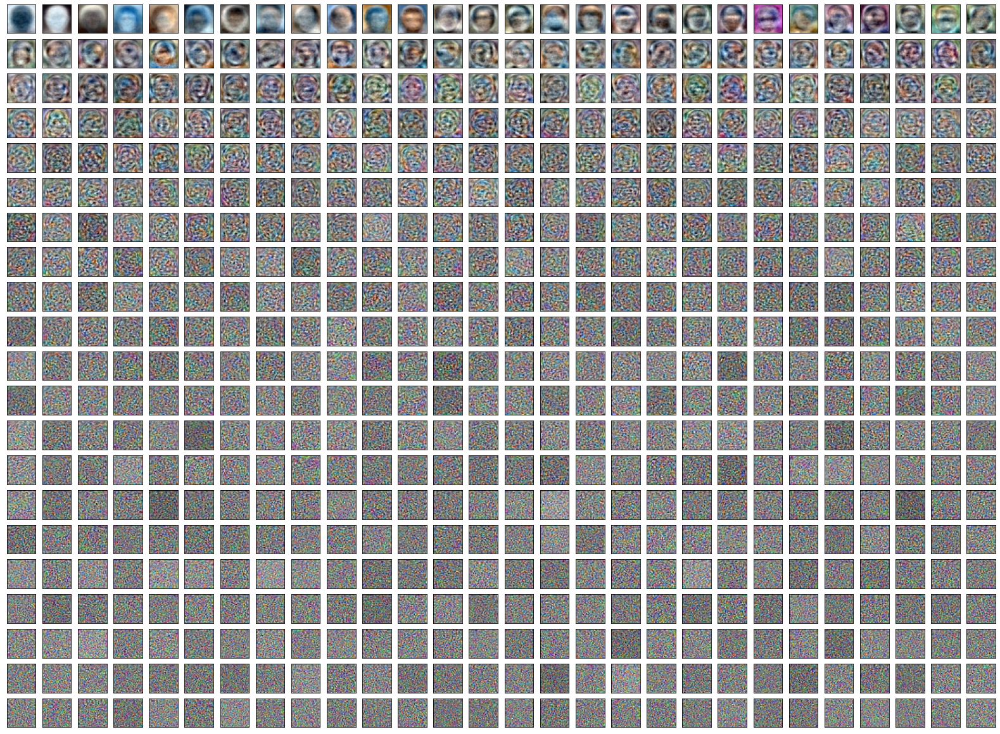

In [118]:
"""
Use the below sample code to visualize the eigen faces and reconstructed images (can write your own function as well)

def plot(image,H,W,C,indices):
    #indices = [randrange(100)+1 for i in range(5)]
    pl = np.reshape(image.T,(-1,H,W,C))
    plt.figure(figsize=(25,25))
    for c,i in enumerate(indices):
        ele = pl[i]
        minim = np.min(ele)
        maxim = np.max(ele)
        ele = (ele - minim) / (maxim - minim)
        ele = np.clip(ele,0,254)
        plt.subplot(1,12,c+1)
        plt.axis('off')
        plt.imshow(ele,cmap=plt.cm.gray)
    plt.show()

# indices = [randrange(12)+1 for i in range(5)]
indices = [0,1,2,3,4,5,6,7,8,9,10,11]
plot(eigen_vectors,H,W,C, indices)"""


# plot eigen faces
eigen_faces = np.dot(A.T, eigen_vectors)
# normalize eigen faces
eigen_faces = eigen_faces / np.linalg.norm(eigen_faces, axis=0)

def plot_eigen_faces(eigenfaces, a, b):
    fig, axes = plt.subplots(a, b, figsize=(b, a), subplot_kw={"xticks":[], "yticks":[]})
    for i, ax in enumerate(axes.flat):
        image = np.array(eigenfaces[:, i])
        image = image.reshape(H, W, C)
        image -= np.min(image)
        image /= np.max(image)
        ax.imshow(image)

plot_eigen_faces(eigen_faces, 21, 28)


"""The eigenfaces are the principal components of a distribution of faces, or equivalently, the eigenvectors of
 the covariance matrix of the set of face images. They basically are the components of which the images are made of.
 Their weights decide how much of each component is present in the image. The first eigenface is the most important"""

#### Reconstruction 

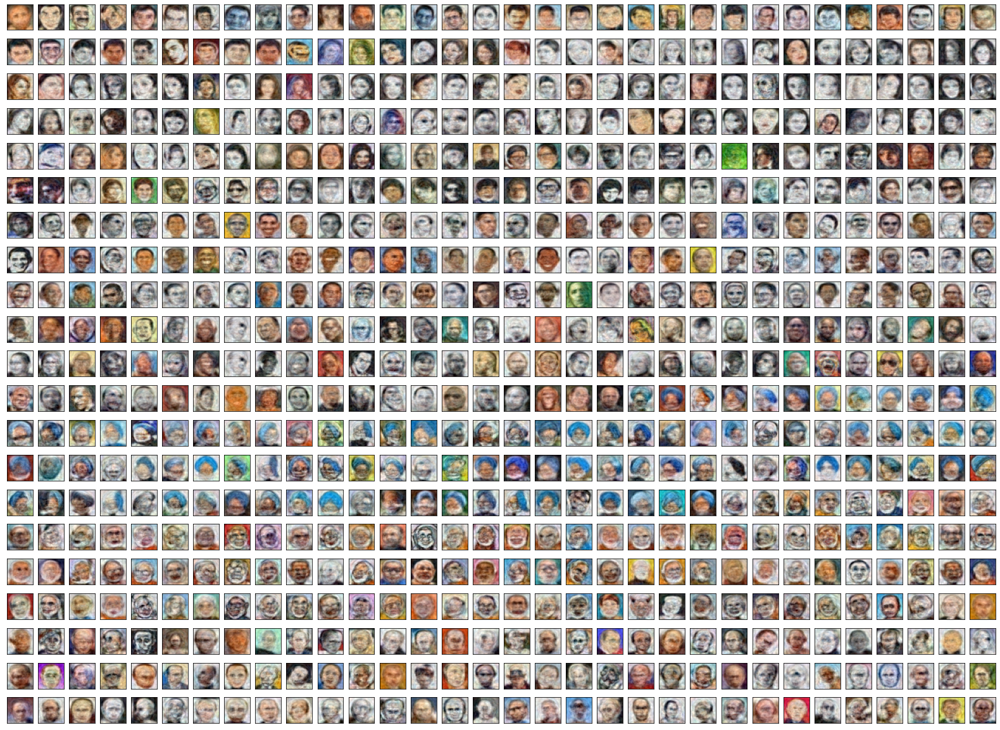

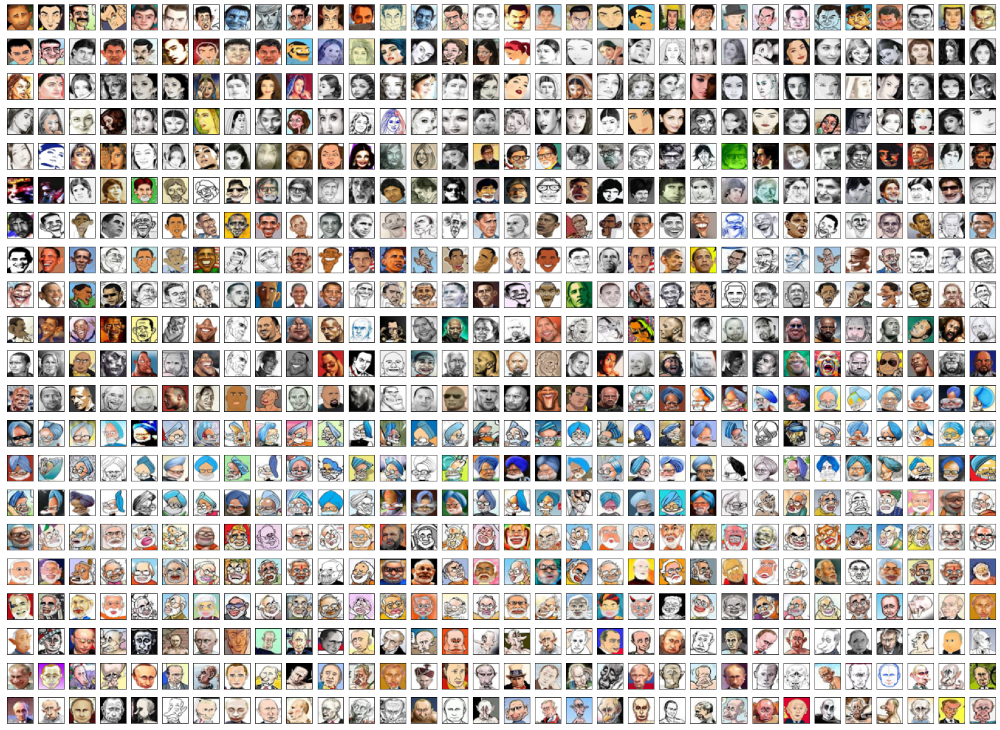

In [119]:
# reconstruction

def reconstruct(A, mean_face, eigen_faces, k):
    required_eigen_faces = eigen_faces[:, :k]
    
    weights = np.dot(A, required_eigen_faces)
    reconstructed = np.dot(weights, required_eigen_faces.T) + mean_face
    return reconstructed

reconstructed = reconstruct(A, mean_face, eigen_faces, 100)

def plot_reconstructed(reconstructed):
    fig, axes = plt.subplots(21, 32, figsize=(28, 21), subplot_kw={"xticks":[], "yticks":[]})
    for i, ax in enumerate(axes.flat):
        image = np.array(reconstructed[i])
        image = image.reshape(H, W, C)
        image -= np.min(image)
        image /= np.max(image)
        ax.imshow(image)

plot_reconstructed(reconstructed)

def plot_actual(X):
    fig, axes = plt.subplots(21, 32, figsize=(28, 21), subplot_kw={"xticks":[], "yticks":[]})
    for i, ax in enumerate(axes.flat):
        image = np.array(X[i])
        image = image.reshape(H, W, C)
        image -= np.min(image)
        image /= np.max(image)
        ax.imshow(image)

plot_actual(X)

#### Plot data in 2D

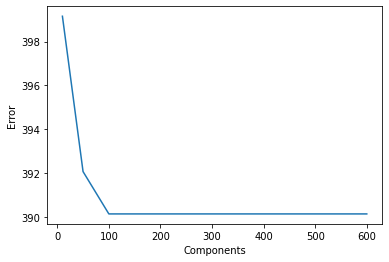

(672, 3072)


TypeError: list indices must be integers or slices, not numpy.float64

In [128]:
# plot data in 2D

# calculate frobenius norm reconstruction error for different values of k
def frobenius_norm_reconstruction_error(A, mean_face, eigen_faces, k):
    required_eigen_faces = eigen_faces[:, :k]
    weights = np.dot(A, required_eigen_faces)
    reconstructed = np.dot(weights, required_eigen_faces.T) + mean_face
    error = np.linalg.norm(A - reconstructed, 'fro')
    return error

# calculate frobenius norm reconstruction error for different values of k
k_vals = [10 , 50, 100, 200, 400, 600]
error = []
for k in k_vals:
    error.append(frobenius_norm_reconstruction_error(A, mean_face, eigen_faces, k))

# plot error vs k
plt.plot( k_vals, error,)
plt.xlabel("Components")
plt.ylabel("Error")
plt.show()

# taking first 2 eigen faces
first_2_eigen_faces = eigen_faces[:, :2]
colors = ["violet", "indigo", "blue", "green", "yellow", "orange", "red", "cyan"]
# plot data in 2D
# def plot_data_in_2D(A, first_2_eigen_faces, colors):
#     weights = np.dot(A, first_2_eigen_faces)
#     plt.figure(figsize=(10,10))
#     for i in range(7):
#         plt.scatter(weights[i*32:(i+1)*32, 0], weights[i*32:(i+1)*32, 1], c=colors[i])
#     plt.legend()
#     plt.show()

# plot_data_in_2D(A, first_2_eigen_faces, colors)

print(flatten(X).shape)
for i in range(N):
    plt.scatter(np.dot(flatten(X)[i], first_2_eigen_faces[:, 0]), np.dot(flatten(X)[i], first_2_eigen_faces[:, 1]), color = colors[y[i]])


"""It can be seen that the data is not very cleanly separated, though there is some separation between the classes."""

## Lets analyze the principal components classwise
- Visualize dominant eigen faces of each of the classes.
- Print the number of principal components required to retain 90% variance for each of the classes and for the entire dataset
- Are the number of components same for entire dataset and each of the classes. If yes why? If not why?

Example output:
```
Number of principal components required for 90% reconstruction of the:
Entire Dataset = 10 
Amitabhbachan = 10
AamirKhan = 10
...
```

In [121]:
# Load data again
X,y = load_data(dirpath)

Dataset shape: (672, 32, 32, 3)
Label shape: (672,)


#### Visualize dominant eigen faces of each of the classes

Classes: [0 1 2 3 4 5 6 7]
Shape of A: (50, 3072)
Shape of Covariance Matrix: (50, 50)
Shape of A: (42, 3072)
Shape of Covariance Matrix: (42, 42)
Shape of A: (79, 3072)
Shape of Covariance Matrix: (79, 79)
Shape of A: (101, 3072)
Shape of Covariance Matrix: (101, 101)
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)


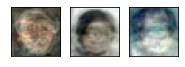

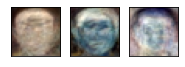

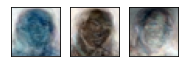

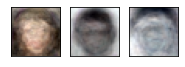

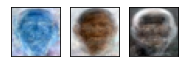

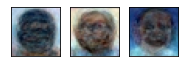

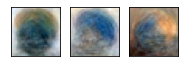

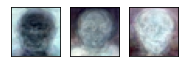

In [122]:
# visualize top 3 eigen faces for each class

classes = np.unique(y)
print("Classes:",classes)

for c in classes:
    X_c = X[y==c]
    eigen_values, eigen_vectors, A, mean_face = eigen(X_c)
    eigen_faces = np.dot(A.T, eigen_vectors)
    # normalize eigen faces
    eigen_faces = eigen_faces / np.linalg.norm(eigen_faces, axis=0)
    indices = [0,1,2]
    # print("Class:",c)
    plot_eigen_faces(eigen_faces, 1, 3)

#### Number of principal components required to retain 90% variance for each of the classes and for the entire dataset

In [123]:
# components required
components = 0
while (variance[components] < 0.90):
    components += 1
print("Components required to retain 90% variance in entire dataset:",components)

# in classes

def plot_variance_in_classes(X,y):
    classes = np.unique(y)
    print("Classes:",classes)
    for c in classes:
        X_c = X[y==c]
        eigen_values, eigen_vectors, A, mean_face = eigen(X_c)
        variance = np.cumsum(eigen_values)/np.sum(eigen_values)
        components = 0
        while (variance[components] < 0.90):
            components += 1
        print("Components required to retain 90% variance in class",c,":",components)

plot_variance_in_classes(X,y)


Components required to retain 90% variance in entire dataset: 114
Classes: [0 1 2 3 4 5 6 7]
Shape of A: (50, 3072)
Shape of Covariance Matrix: (50, 50)
Components required to retain 90% variance in class 0 : 20
Shape of A: (42, 3072)
Shape of Covariance Matrix: (42, 42)
Components required to retain 90% variance in class 1 : 23
Shape of A: (79, 3072)
Shape of Covariance Matrix: (79, 79)
Components required to retain 90% variance in class 2 : 27
Shape of A: (101, 3072)
Shape of Covariance Matrix: (101, 101)
Components required to retain 90% variance in class 3 : 35
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Components required to retain 90% variance in class 4 : 42
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Components required to retain 90% variance in class 5 : 56
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)
Components required to retain 90% variance in class 6 : 49
Shape of A: (100, 3072)
Shape of Covariance Matrix: (100, 100)

#### Analysis : Are the number of components same for entire dataset and each of the classes. If yes why? If not why?

In [124]:
# observation/analysis

"""
It is observed that the no. of components required to retain 90% variance in the entire dataset is larger 
than the no. of components required to retain 90% variance in each class. 

Reason : 
This is expected, because intra-class variance is less than the inter-class variance.
that is, the variance within a class is less than the variance between classes.
so more components are required to retain 90% variance in the entire dataset than in each class.

"""

'\nIt is observed that the no. of components required to retain 90% variance in the entire dataset is larger \nthan the no. of components required to retain 90% variance in each class. \n\nReason : \nThis is expected, because intra-class variance is less than the inter-class variance.\nthat is, the variance within a class is less than the variance between classes.\nso more components are required to retain 90% variance in the entire dataset than in each class.\n\n'

## Linear Regression (continued)
1. Perform linear regression on below datapoints
2. Use PCA for dimensionality reduction on this datapoints and then perform Linear regression.
3. Perform this experiment on different number of components and report the score for linear regression. Plot the graph of [1-200] principal components vs regression score. What do you observe?

Note :- Can use inbuilt functions for Linear Regression and PCA for this question

In [125]:
# datapoints
X,_ = load_data(dirpath)
X = X.reshape((X.shape[0],-1))
label = np.array([randrange((32*32*3)) for i in range(5)])
label = np.mean(X[:,label], axis = 1)
print(label.shape)

Dataset shape: (672, 32, 32, 3)
Label shape: (672,)
(672,)


(672, 3072)


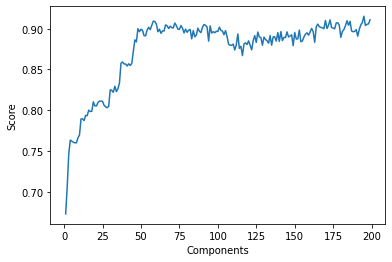

In [126]:
# code here

print(X.shape)

# pca with sklearn


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


# linear regression on pca

# load data
y = label
# X,y = load_data(dirpath)
# X = X.reshape((X.shape[0],-1))

# standardize data
scaler = StandardScaler()
X = scaler.fit_transform(X)


scores = []
for i in range(1,200):
    # pca
    pca = PCA(n_components=i)
    X_pca = pca.fit_transform(X)
    # linear regression
    X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
    reg = LinearRegression().fit(X_train, y_train)
    # print("Components:",i,"Score:",reg.score(X_test,y_test))
    scores.append(reg.score(X_test,y_test))


# plot components vs score

plt.plot(range(1,200),scores)
plt.xlabel("Components")
plt.ylabel("Score")
plt.show()

# write the scores in a file

with open("scores.txt","w") as f:
    f.write(str(scores))

    


# # pca
# pca = PCA(n_components=20)
# X = pca.fit_transform(X)

# linear regression


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# reg = LinearRegression().fit(X_train, y_train)
# print("Train score:",reg.score(X_train,y_train))
# print("Test score:",reg.score(X_test,y_test))

# plot
# plt.figure(figsize=(10,10))
# plt.scatter(X[:,0],X[:,1],c=y)
# plt.show()








In [129]:
# analysis / plot (split the cells if required)
"""
It is observed that the score increases with the increase in the no. of components, but after it reaches a value, the increase is negligible.
"""

'\nIt is observed that the score increases with the increase in the no. of components, but after it reaches a value, the increase is negligible.\n'